### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn


%matplotlib inline
sns.set_style('dark')
sns.set(font_scale=1.5)

from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report, mean_absolute_error, mean_squared_error,r2_score
from sklearn.metrics import plot_confusion_matrix, plot_precision_recall_curve, plot_roc_curve, accuracy_score
from sklearn.metrics import auc, f1_score, precision_score, recall_score, roc_auc_score

import feature_engine.missing_data_imputers as mdi
from feature_engine.outlier_removers import Winsorizer

import warnings
warnings.filterwarnings('ignore')


pd.options.display.max_columns= None
pd.options.display.max_rows = None

### Data Exploration

In [3]:
df = pd.read_csv("QN.csv")

In [4]:
df.head()

,Borough,Block,Lot,CD,CT2010,CB2010,SchoolDist,Council,ZipCode,FireComp,PolicePrct,HealthCenterDistrict,HealthArea,SanitBoro,SanitDistrict,SanitSub,Address,ZoneDist1,ZoneDist2,ZoneDist3,ZoneDist4,Overlay1,Overlay2,SPDist1,SPDist2,SPDist3,LtdHeight,SplitZone,BldgClass,LandUse,Easements,OwnerType,OwnerName,LotArea,BldgArea,ComArea,ResArea,OfficeArea,RetailArea,GarageArea,StrgeArea,FactryArea,OtherArea,AreaSource,NumBldgs,NumFloors,UnitsRes,UnitsTotal,LotFront,LotDepth,BldgFront,BldgDepth,Ext,ProxCode,IrrLotCode,LotType,BsmtCode,AssessLand,AssessTot,ExemptLand,ExemptTot,YearBuilt,YearAlter1,YearAlter2,HistDist,Landmark,BuiltFAR,ResidFAR,CommFAR,FacilFAR,BoroCode,BBL,CondoNo,Tract2010,XCoord,YCoord,ZoneMap,ZMCode,Sanborn,TaxMap,EDesigNum,APPBBL,APPDate,PLUTOMapID,FIRM07_FLAG,PFIRM15_FLAG,Version
0,QN,6,1,402,1.0,NaN,30.0,26.0,11101.0,L115,108.0,41.0,720.0,4.0,2.0,3B,2 STREET,R10,NaN,NaN,NaN,C2-5,NaN,SHP,NaN,NaN,NaN,N,Q1,9.0,1,C,NYC HPD,1684828,0,0,0,0,0,0,0,0,0,7,0,0.0,0,0,524.58,268.00,0.0,0.0,NaN,0.0,Y,5.0,5.0,17036550,18131850,17036550,18131850,0,0,0,NaN,NaN,0.00,10.0,0.0,10.0,4,4000060001,0,1,NaN,NaN,8d,Y,401 011,40101.0,NaN,4.000060e+09,09/20/2013,1,1.0,1.0,18V1
1,QN,6,3,402,1.0,1015.0,30.0,26.0,11101.0,L115,108.0,41.0,720.0,4.0,2.0,3B,2 STREET,R10,NaN,NaN,NaN,NaN,NaN,SHP,NaN,NaN,NaN,N,U2,7.0,0,P,NORCEM PROPERTIES INC,21139,0,0,0,0,0,0,0,0,0,7,1,0.0,0,0,192.17,110.00,0.0,0.0,NaN,0.0,N,5.0,0.0,0,0,0,0,0,0,0,NaN,NaN,0.00,10.0,0.0,10.0,4,4000060003,0,1,995513.0,209421.0,8d,NaN,401 011,40101.0,NaN,0.000000e+00,NaN,1,1.0,1.0,18V1
2,QN,6,8,402,1.0,1011.0,30.0,26.0,11101.0,L115,108.0,41.0,720.0,4.0,2.0,3B,1-50 51 AVENUE,R10,NaN,NaN,NaN,NaN,NaN,SHP,NaN,NaN,NaN,N,W1,8.0,0,C,NYC DEPT OF EDUCATION,33454,136108,136108,0,0,0,0,0,0,0,2,1,5.0,0,1,130.00,184.48,125.0,249.0,NaN,1.0,N,0.0,0.0,621900,19364850,621900,19364850,2011,2011,0,NaN,NaN,4.07,10.0,0.0,10.0,4,4000060008,0,1,995477.0,209867.0,8d,NaN,401 011,40101.0,NaN,4.000060e+09,08/07/2013,1,1.0,1.0,18V1
3,QN,6,20,402,1.0,NaN,30.0,26.0,11101.0,L115,108.0,41.0,720.0,4.0,2.0,3B,2 STREET,R10,NaN,NaN,NaN,NaN,NaN,SHP,NaN,NaN,NaN,N,V0,11.0,0,C,HOUSING PRESERVATION,28703,0,0,0,0,0,0,0,0,0,4,0,0.0,0,0,0.00,0.00,0.0,0.0,NaN,0.0,Y,6.0,5.0,82516,82516,82516,82516,0,0,0,NaN,NaN,0.00,10.0,0.0,10.0,4,4000060020,0,1,NaN,NaN,8d,NaN,401 011,40101.0,NaN,4.000060e+09,09/20/2013,1,1.0,1.0,18V1
4,QN,6,30,402,1.0,NaN,30.0,26.0,11101.0,L115,108.0,41.0,720.0,4.0,2.0,3B,CENTER BOULEVARD,R10,NaN,NaN,NaN,C2-5,NaN,SHP,NaN,NaN,NaN,N,V0,11.0,0,C,HOUSING PRESERVATION,32493,0,0,0,0,0,0,0,0,0,4,0,0.0,0,0,145.11,202.08,0.0,0.0,NaN,0.0,Y,4.0,5.0,95596,95596,95596,95596,0,0,0,NaN,NaN,0.00,10.0,0.0,10.0,4,4000060030,0,1,NaN,NaN,8d,NaN,401 011,40101.0,NaN,4.000060e+09,09/08/2017,1,1.0,1.0,18V1


In [5]:
df = df[['Address', 'BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR', 'Lot', 'LotArea', 'LotDepth', 
         'NumBldgs', 'NumFloors', 'OfficeArea', 'ResArea', 'ResidFAR', 'RetailArea', 'YearBuilt', 'YearAlter1', 
         'ZipCode', 'YCoord', 'XCoord']]

In [6]:
df.head()

,Address,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,Lot,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,YearBuilt,YearAlter1,ZipCode,YCoord,XCoord
0,2 STREET,0,0.0,0.00,0.0,10.0,1,1684828,268.00,0,0.0,0,0,10.0,0,0,0,11101.0,NaN,NaN
1,2 STREET,0,0.0,0.00,0.0,10.0,3,21139,110.00,1,0.0,0,0,10.0,0,0,0,11101.0,209421.0,995513.0
2,1-50 51 AVENUE,136108,249.0,4.07,0.0,10.0,8,33454,184.48,1,5.0,0,0,10.0,0,2011,2011,11101.0,209867.0,995477.0
3,2 STREET,0,0.0,0.00,0.0,10.0,20,28703,0.00,0,0.0,0,0,10.0,0,0,0,11101.0,NaN,NaN
4,CENTER BOULEVARD,0,0.0,0.00,0.0,10.0,30,32493,202.08,0,0.0,0,0,10.0,0,0,0,11101.0,NaN,NaN


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 324583 entries, 0 to 324582
Data columns (total 20 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Address     324409 non-null  object 
 1   BldgArea    324583 non-null  int64  
 2   BldgDepth   324583 non-null  float64
 3   BuiltFAR    324583 non-null  float64
 4   CommFAR     324583 non-null  float64
 5   FacilFAR    324583 non-null  float64
 6   Lot         324583 non-null  int64  
 7   LotArea     324583 non-null  int64  
 8   LotDepth    324583 non-null  float64
 9   NumBldgs    324583 non-null  int64  
 10  NumFloors   324583 non-null  float64
 11  OfficeArea  324583 non-null  int64  
 12  ResArea     324583 non-null  int64  
 13  ResidFAR    324583 non-null  float64
 14  RetailArea  324583 non-null  int64  
 15  YearBuilt   324583 non-null  int64  
 16  YearAlter1  324583 non-null  int64  
 17  ZipCode     323318 non-null  float64
 18  YCoord      316136 non-null  float64
 19  XC

In [8]:
df.describe(include='all')

,Address,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,Lot,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,YearBuilt,YearAlter1,ZipCode,YCoord,XCoord
count,324409,3.245830e+05,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,3.245830e+05,324583.000000,324583.000000,324583.000000,3.245830e+05,3.245830e+05,324583.000000,3.245830e+05,324583.000000,324583.000000,323318.000000,316136.000000,3.161360e+05
unique,315974,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,ROCKAWAY BEACH BLVD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,3.758058e+03,41.848987,0.741318,0.083244,1.625100,75.311132,7.363389e+03,103.444550,1.437481,2.050490,1.446627e+02,2.611998e+03,0.909461,1.802522e+02,1864.232603,145.439505,11383.720848,200622.280313,1.034140e+06
std,NaN,4.625819e+04,33.297110,4.933760,0.528470,0.880348,428.619250,4.031173e+05,62.747427,4.186812,1.015941,4.807199e+03,1.924075e+04,0.670547,4.077004e+03,380.078474,519.876898,110.768303,15838.706805,1.616350e+04
min,NaN,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,11001.000000,142173.000000,9.953000e+05
25%,NaN,1.284000e+03,32.000000,0.410000,0.000000,1.000000,18.000000,2.122000e+03,100.000000,1.000000,2.000000,0.000000e+00,1.190000e+03,0.600000,0.000000e+00,1925.000000,0.000000,11364.000000,190668.000000,1.021286e+06
50%,NaN,1.717000e+03,38.000000,0.600000,0.000000,2.000000,36.000000,2.850000e+03,100.000000,1.000000,2.000000,0.000000e+00,1.520000e+03,0.600000,0.000000e+00,1935.000000,0.000000,11385.000000,201510.000000,1.035070e+06
75%,NaN,2.392000e+03,49.000000,0.870000,0.000000,2.000000,59.000000,4.000000e+03,100.000000,2.000000,2.500000,0.000000e+00,2.112000e+03,0.900000,0.000000e+00,1950.000000,0.000000,11421.000000,213084.000000,1.047428e+06


In [9]:
df.shape

(324583, 20)

In [10]:
df.columns

Index(['Address', 'BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR',
       'Lot', 'LotArea', 'LotDepth', 'NumBldgs', 'NumFloors', 'OfficeArea',
       'ResArea', 'ResidFAR', 'RetailArea', 'YearBuilt', 'YearAlter1',
       'ZipCode', 'YCoord', 'XCoord'],
      dtype='object')

### Replace zero value with NaNs

In [11]:
df['Address'].value_counts()

ROCKAWAY BEACH BLVD             85
BEACH CHANNEL DRIVE             74
SPRINGFIELD BLVD                66
ROCKAWAY BOULEVARD              60
NORTHERN BOULEVARD              58
CROSS BAY BOULEVARD             57
102 STREET                      56
NORTH CONDUIT AVENUE            55
159 STREET                      46
GUY R BREWER BLVD               45
LINDEN BOULEVARD                43
MERRICK BOULEVARD               41
32 AVENUE                       40
BAY 32 STREET                   39
149 AVENUE                      38
79 STREET                       38
ATLANTIC AVENUE                 37
LIBERTY AVENUE                  37
133 AVENUE                      37
BEACH 43 STREET                 36
UNION TURNPIKE                  36
150 STREET                      33
ASTORIA BOULEVARD               33
JAMAICA AVENUE                  32
RUSSELL STREET                  31
SOUTH CONDUIT AVENUE            31
BAYVIEW AVENUE                  30
QUEENS BOULEVARD                29
BAYFIELD AVENUE     

In [12]:
df['BldgArea'].value_counts()

0           12737
1224         3177
1280         2791
1600         2526
2000         2432
1152         2161
1440         2136
1800         2134
1344         2054
2400         1959
1200         1947
2200         1940
1248         1914
1296         1897
1216         1705
1400         1583
2160         1495
1360         1469
1120         1424
1260         1381
1080         1349
2080         1339
1312         1274
1920         1231
3000         1215
960          1200
2100         1144
1520         1127
1680         1108
1320         1104
1760         1096
2500         1053
1056         1052
1188         1040
1568         1032
1480          990
1980          982
1264          970
1728          956
1848          945
1368          921
3300          914
2600          887
1584          886
1500          852
1536          847
1408          843
1560          842
1050          840
896           834
1720          831
1328          825
1620          823
1632          808
1184          768
1700      

In [13]:
df['BldgArea'].replace(0,np.nan,inplace=True)

In [14]:
df['BldgDepth'].value_counts()

36.00      20857
34.00      15289
30.00      15099
40.00      14865
0.00       13711
50.00      12852
38.00      12669
32.00      12622
28.00      12056
35.00      11220
55.00       9752
45.00       9171
42.00       8991
26.00       7922
37.00       7556
48.00       7528
44.00       6861
46.00       6769
52.00       6220
33.00       5952
60.00       5659
47.00       5121
25.00       4490
54.00       3889
24.00       3793
43.00       3610
41.00       3424
27.00       3337
39.00       3228
53.00       2744
56.00       2535
31.00       2531
100.00      2321
51.00       2251
29.00       2204
49.00       2117
58.00       1854
20.00       1786
65.00       1618
68.00       1496
57.00       1485
70.00       1461
80.00       1288
62.00       1283
22.00       1113
63.00        981
90.00        937
75.00        867
59.00        731
66.00        663
64.00        660
52.50        613
23.00        610
38.50        598
85.00        577
72.00        512
61.00        455
32.50        453
34.50        4

In [15]:
df['BldgDepth'].replace(0.00,np.nan,inplace=True)

In [16]:
df['BuiltFAR'].value_counts()

0.00       13132
0.60        5002
0.68        4946
0.50        4872
0.56        4823
0.64        4709
0.53        4583
0.51        4578
0.43        4553
0.54        4542
0.52        4340
0.42        4327
0.55        4276
0.44        4250
0.48        4206
0.46        4197
0.45        4161
0.49        4138
0.58        3998
0.59        3977
0.57        3961
0.30        3915
0.47        3898
0.29        3806
0.41        3750
0.63        3737
0.65        3726
0.66        3720
0.40        3672
0.28        3648
0.38        3626
0.62        3591
0.72        3570
0.36        3569
0.32        3534
0.61        3523
0.67        3512
0.70        3508
0.34        3506
0.39        3465
0.35        3423
0.33        3386
0.37        3380
0.31        3258
0.26        2987
0.27        2981
0.69        2979
0.74        2932
0.71        2689
1.00        2666
0.76        2634
0.80        2609
0.75        2497
0.25        2454
0.73        2413
0.78        2410
0.77        2380
0.24        2216
0.88        20

In [17]:
df['BuiltFAR'].replace(0.00,np.nan,inplace=True)

In [18]:
df['CommFAR'].value_counts()

0.0     312201
1.0       5141
2.0       3270
3.4       1244
3.0        903
5.0        616
4.0        479
0.5        320
6.0        236
8.0         78
12.0        52
15.0        30
10.0        13
Name: CommFAR, dtype: int64

In [19]:
df['CommFAR'].replace(0.0,np.nan,inplace=True)

In [20]:
df['FacilFAR'].value_counts()

1.0     159455
2.0     141498
4.8       6661
3.0       5580
2.4       5134
0.0       2042
6.5       1775
4.0       1391
5.0        735
10.0       152
8.0         78
12.0        52
15.0        30
Name: FacilFAR, dtype: int64

In [21]:
df['FacilFAR'].replace(0.00,np.nan,inplace=True)

In [22]:
df['Lot'].value_counts()

1       9139
14      4956
12      4928
20      4917
18      4916
16      4905
15      4841
6       4789
17      4767
21      4737
25      4724
19      4694
22      4687
23      4678
24      4677
26      4663
30      4608
9       4580
28      4536
11      4521
27      4496
10      4466
29      4438
7       4404
8       4350
13      4347
32      4335
35      4271
33      4248
5       4192
40      4180
34      4162
31      4144
36      4119
38      4111
37      3984
3       3965
39      3932
42      3880
41      3811
46      3800
44      3793
50      3743
43      3671
45      3656
48      3632
4       3598
47      3460
52      3363
49      3241
54      3178
51      3178
53      3052
56      3031
55      2991
58      2822
60      2793
57      2744
59      2569
2       2517
62      2386
61      2348
63      2125
64      2040
65      1976
66      1867
68      1725
67      1706
70      1653
69      1564
71      1432
72      1399
74      1268
75      1248
73      1248
76      1114
78      1030

In [23]:
df['LotArea'].value_counts()

4000         36607
2500         22577
2000         21538
3000         11891
1800          8177
5000          8103
6000          4636
2400          4461
2200          3993
1900          3547
2600          2808
3800          2546
1600          2531
2300          2493
2800          2486
2100          2348
3200          2050
2700          2018
4500          1882
3500          1842
3600          1417
2900          1344
3300          1258
4200          1248
2375          1198
2250          1097
4400          1026
4100           987
3400           982
3100           980
0              977
10000          933
4800           820
2850           819
3900           818
8000           808
7500           756
3125           722
2017           721
2650           709
1700           705
2742           692
3142           685
2521           675
2342           670
1710           642
2442           640
2142           624
3700           601
5500           599
3325           586
4600           561
1942        

In [24]:
df['LotArea'].replace(0,np.nan,inplace=True)

In [25]:
df['LotDepth'].value_counts()

100.00     181144
95.00       11617
90.00        5884
80.00        3980
100.83       2535
125.00       2423
110.00       2334
105.00       2022
100.92       1833
120.00       1734
85.00        1716
97.00        1699
100.08       1535
92.00        1518
75.00        1460
101.00       1431
99.00        1397
98.00        1298
150.00       1283
97.42        1234
102.00       1218
93.00        1204
96.00        1183
115.00       1128
94.00        1086
0.00         1068
50.00        1064
103.00        997
104.00        855
60.00         847
200.00        798
107.00        792
70.00         731
87.00         723
91.00         716
106.00        701
86.00         636
88.00         625
112.00        613
89.00         609
130.00        604
109.00        602
108.00        591
82.00         576
84.00         563
140.00        535
99.75         526
65.00         524
83.00         509
111.00        502
94.42         498
97.50         467
113.00        463
40.00         462
114.00        455
77.00     

In [26]:
df['LotDepth'].replace(0.00,np.nan,inplace=True)

In [27]:
df['NumBldgs'].value_counts()

1       181474
2       127115
0        12074
3         2729
4          406
5          165
6           92
7           49
8           48
9           45
10          35
13          24
12          23
11          23
15          15
16          15
14          14
17          11
28           8
19           8
24           8
22           6
36           6
27           6
18           6
21           6
53           6
25           5
32           5
23           4
26           4
109          4
30           4
33           4
35           4
43           4
52           3
48           3
46           3
20           3
31           3
29           3
64           3
54           3
58           3
80           3
98           3
101          3
92           3
90           3
75           3
102          2
91           2
70           2
88           2
34           2
37           2
119          2
39           2
42           2
45           2
89           2
100          2
67           2
78           2
140          2
66        

In [28]:
df['NumBldgs'].replace(0,np.nan,inplace=True)

In [29]:
df['NumFloors'].value_counts()

2.00      160878
2.50       53149
1.00       30505
3.00       27772
1.50       16738
0.00       12819
2.75        6476
1.67        6349
4.00        3203
1.75        2666
6.00        1760
5.00         626
7.00         258
3.50         228
2.67         185
8.00         178
4.50          82
9.00          81
2.25          64
10.00         61
12.00         53
3.75          43
16.00         36
13.00         36
11.00         33
15.00         33
14.00         28
1.25          24
1.85          19
1.60          19
2.33          16
20.00         11
17.00         10
4.30           9
1.90           8
18.00          8
32.00          5
5.50           5
27.00          5
21.00          5
25.00          5
3.25           4
30.00          4
2.30           3
1.33           3
19.00          3
41.00          3
24.00          3
22.00          3
2.40           3
3.40           2
3.67           2
1.65           2
2.85           2
26.00          2
44.00          2
6.50           2
1.66           2
3.60          

In [30]:
df['NumFloors'].replace(0.00,np.nan,inplace=True)

In [31]:
df['OfficeArea'].value_counts()

0          316726
1000          202
2000          156
1200          156
1500          114
1100          101
500            95
800            84
900            83
3000           80
2500           80
600            78
400            74
4000           73
2400           66
1800           65
5000           61
700            59
1600           50
1400           48
1300           44
750            44
960            43
2200           41
1040           41
1080           41
200            40
6000           40
4500           36
10000          33
300            32
720            31
1700           30
2100           28
880            28
1250           28
3500           28
3600           26
1120           24
3200           23
1050           23
1140           23
2800           22
7000           21
7500           21
8000           21
1260           20
1900           19
2250           19
1350           19
1150           19
950            19
1750           18
1089           18
9000           18
2300      

In [32]:
df['OfficeArea'].replace(0,np.nan,inplace=True)

In [33]:
df['ResArea'].value_counts()

0          28593
1224        4302
1280        3027
1600        2768
1296        2555
2000        2514
1440        2477
1152        2407
1200        2313
2200        2184
1344        2107
1400        2103
1260        2091
1248        2028
1800        2012
2400        1841
1216        1784
1360        1764
2080        1634
1080        1576
1120        1514
960         1505
1480        1436
1188        1424
2160        1354
1520        1332
1332        1315
1312        1308
1920        1269
1320        1222
1680        1158
1056        1145
1368        1104
1848        1101
2100        1089
1760        1085
1568        1034
1264        1021
1300         957
1728         918
1050         917
1500         910
1560         909
1125         898
1720         887
896          881
1328         878
3000         877
2500         874
1980         860
1000         836
1408         836
1536         833
2280         802
1020         794
1584         785
1170         782
1184         777
1232         7

In [34]:
df['ResArea'].replace(0,np.nan,inplace=True)

In [35]:
df['ResidFAR'].value_counts()

0.90     88334
0.60     88150
0.50     70902
1.25     23299
2.00     15170
1.35     13230
0.00      8315
3.00      5580
2.43      5259
4.00      1391
3.44      1360
1.10      1290
5.00       735
1.65       718
1.02       403
6.02       135
7.52       122
8.00        78
10.00       60
12.00       52
Name: ResidFAR, dtype: int64

In [36]:
df['ResidFAR'].replace(0.00,np.nan,inplace=True)

In [37]:
df['RetailArea'].value_counts()

0          309930
1200          372
1000          365
1100          362
1500          238
2000          205
900           180
800           178
1400          168
1800          165
1300          157
1600          146
1080          128
2500          128
960           116
1260          111
1040           96
1240           92
1089           89
2400           77
990            77
1700           75
600            75
1250           73
4000           72
700            70
1120           68
1360           67
1140           67
1188           65
1160           63
2200           63
1900           63
5000           62
750            62
3000           59
2100           59
2250           59
6000           55
1280           55
4500           52
10000          51
1440           51
1320           49
500            47
1750           47
1020           46
1050           45
1180           45
1045           44
950            44
1060           43
880            42
720            42
3600           41
3500      

In [38]:
df['RetailArea'].replace(0,np.nan,inplace=True)

In [39]:
df['YearBuilt'].value_counts()

1920    42185
1930    36785
1950    32470
1925    31127
1940    24193
1945    17658
1960    15489
1935    14895
1955    13229
0       12907
1910     9576
1931     8146
1965     6581
1915     5581
1970     4200
1901     3907
1975     2157
2004     2077
2005     2057
2006     1785
2007     1717
1928     1443
2002     1220
2003     1141
2008     1022
2001      888
2000      869
1929      841
1989      784
1999      769
1980      744
1988      731
1905      720
1987      669
1996      616
1926      599
1998      588
1927      584
2009      558
1985      547
1997      532
1990      520
2014      518
1932      517
2011      508
1939      492
1957      457
2012      452
1949      433
1924      431
2010      421
1995      419
1986      419
1993      409
1941      396
1963      395
1962      392
1923      391
1964      389
2013      382
1992      379
1994      365
1938      361
1951      360
2015      347
1961      345
1952      345
1959      336
2016      335
1991      330
1937      319
1968  

In [40]:
df['YearBuilt'].replace(0,np.nan,inplace=True)

In [41]:
df['YearAlter1'].value_counts()

0       301023
2008      2430
2005      1662
2009      1545
2006      1341
2007      1279
2014      1046
2004      1005
2015       920
2000       837
2001       793
1999       758
2013       744
2002       743
2003       688
1998       670
2016       658
1995       647
1996       596
2012       579
2010       529
1997       496
2011       487
1994       436
1993       300
2017       281
1992       221
1988       203
1990       179
1989       159
1987       159
1991       138
1985       108
1980       100
1982        86
1986        84
1983        74
1984        71
1981        36
1979        33
1978        26
1975        23
1977        22
1960        20
1970        20
1969        20
1966        20
1976        19
1972        19
1971        19
1965        17
1974        17
1967        17
1964        16
1963        16
1919        15
1962        14
1968        14
1973        14
1961        12
1959        12
1957         8
1955         7
1958         7
1950         4
1956         4
1941      

In [42]:
df['YearAlter1'].replace(0,np.nan,inplace=True)

In [43]:
df['ZipCode'].value_counts()

11385.0    14652
11434.0    10850
11413.0     9841
11357.0     9777
11420.0     9359
11412.0     8730
11379.0     8699
11358.0     8615
11377.0     8190
11378.0     8161
11368.0     7954
11419.0     7581
11373.0     7199
11375.0     6871
11355.0     6847
11422.0     6833
11691.0     6779
11432.0     6665
11433.0     6415
11361.0     6404
11365.0     6386
11421.0     6261
11435.0     6205
11364.0     6022
11414.0     5968
11417.0     5925
11429.0     5796
11105.0     5550
11411.0     5364
11369.0     5328
11418.0     5257
11423.0     5229
11354.0     5214
11367.0     4794
11356.0     4749
11103.0     4527
11426.0     4482
11436.0     4464
11428.0     4341
11427.0     4275
11370.0     4103
11416.0     3816
11694.0     3743
11366.0     3657
11362.0     3405
11374.0     3301
11101.0     3263
11106.0     3179
11102.0     3002
11372.0     2745
11360.0     2511
11004.0     2502
11692.0     2384
11363.0     2186
11693.0     1963
11104.0     1820
11415.0     1296
11001.0     1241
11040.0      5

In [44]:
df['YCoord'].value_counts()

221413.0    26
221954.0    22
221057.0    22
205539.0    20
221157.0    20
205398.0    20
188711.0    20
195743.0    20
177029.0    19
220795.0    19
195688.0    19
187483.0    19
188427.0    19
211009.0    19
207339.0    19
221693.0    19
211887.0    19
221313.0    18
202845.0    18
195178.0    18
194491.0    18
196425.0    18
209037.0    18
197562.0    18
211652.0    18
216912.0    18
195491.0    18
216406.0    17
216677.0    17
210677.0    17
222370.0    17
221053.0    17
202469.0    17
194583.0    17
209680.0    17
205563.0    17
192354.0    17
214552.0    17
220895.0    17
216385.0    17
197715.0    17
192365.0    17
221593.0    17
216210.0    17
214238.0    17
221695.0    17
204480.0    17
214285.0    17
194554.0    17
203129.0    17
192408.0    17
205265.0    17
198243.0    17
197855.0    17
206095.0    16
189765.0    16
212345.0    16
215827.0    16
198204.0    16
211513.0    16
189810.0    16
196104.0    16
215533.0    16
216367.0    16
193851.0    16
193095.0    16
204623.0  

In [45]:
df['XCoord'].value_counts()

1034276.0    27
1019317.0    25
1031596.0    21
1043143.0    20
1039071.0    19
1016780.0    18
1053987.0    18
1041926.0    18
1041609.0    18
1054056.0    18
1038301.0    18
1039076.0    18
1036156.0    17
1033309.0    17
1054560.0    17
1039999.0    17
1024007.0    17
1035456.0    17
1039446.0    16
1035693.0    16
1016453.0    16
1011772.0    16
1019479.0    16
1054607.0    16
1041434.0    16
1034135.0    16
1039203.0    16
1040984.0    16
1034917.0    16
1040162.0    16
1037268.0    16
1035478.0    16
1034575.0    16
1038553.0    16
1038591.0    16
1056165.0    16
1039078.0    16
1037954.0    16
1035422.0    16
1038819.0    16
1036736.0    16
1034378.0    16
1038309.0    16
1014172.0    16
1039764.0    16
1035377.0    16
1036183.0    16
1042119.0    16
1011704.0    16
1036311.0    16
1035798.0    15
1038335.0    15
1045442.0    15
1013913.0    15
1050044.0    15
1024616.0    15
1036592.0    15
1036864.0    15
1034046.0    15
1051205.0    15
1056865.0    15
1034743.0    15
1042615.

### Treat Missing Values

In [46]:
df.isnull().sum()

Address          174
BldgArea       12737
BldgDepth      13711
BuiltFAR       13132
CommFAR       312201
FacilFAR        2042
Lot                0
LotArea          977
LotDepth        1068
NumBldgs       12074
NumFloors      12819
OfficeArea    316726
ResArea        28593
ResidFAR        8315
RetailArea    309930
YearBuilt      12907
YearAlter1    301023
ZipCode         1265
YCoord          8447
XCoord          8447
dtype: int64

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 324583 entries, 0 to 324582
Data columns (total 20 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Address     324409 non-null  object 
 1   BldgArea    311846 non-null  float64
 2   BldgDepth   310872 non-null  float64
 3   BuiltFAR    311451 non-null  float64
 4   CommFAR     12382 non-null   float64
 5   FacilFAR    322541 non-null  float64
 6   Lot         324583 non-null  int64  
 7   LotArea     323606 non-null  float64
 8   LotDepth    323515 non-null  float64
 9   NumBldgs    312509 non-null  float64
 10  NumFloors   311764 non-null  float64
 11  OfficeArea  7857 non-null    float64
 12  ResArea     295990 non-null  float64
 13  ResidFAR    316268 non-null  float64
 14  RetailArea  14653 non-null   float64
 15  YearBuilt   311676 non-null  float64
 16  YearAlter1  23560 non-null   float64
 17  ZipCode     323318 non-null  float64
 18  YCoord      316136 non-null  float64
 19  XC

In [48]:
imputer = mdi.MeanMedianImputer(imputation_method='median',variables=None)

In [49]:
imputer.fit(df)

MeanMedianImputer(imputation_method='median',
                  variables=['BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR',
                             'FacilFAR', 'Lot', 'LotArea', 'LotDepth',
                             'NumBldgs', 'NumFloors', 'OfficeArea', 'ResArea',
                             'ResidFAR', 'RetailArea', 'YearBuilt',
                             'YearAlter1', 'ZipCode', 'YCoord', 'XCoord'])

In [50]:
df = imputer.transform(df)

In [51]:
df.isnull().sum()

Address       174
BldgArea        0
BldgDepth       0
BuiltFAR        0
CommFAR         0
FacilFAR        0
Lot             0
LotArea         0
LotDepth        0
NumBldgs        0
NumFloors       0
OfficeArea      0
ResArea         0
ResidFAR        0
RetailArea      0
YearBuilt       0
YearAlter1      0
ZipCode         0
YCoord          0
XCoord          0
dtype: int64

### Change data type

In [52]:
df.dtypes

Address        object
BldgArea      float64
BldgDepth     float64
BuiltFAR      float64
CommFAR       float64
FacilFAR      float64
Lot             int64
LotArea       float64
LotDepth      float64
NumBldgs      float64
NumFloors     float64
OfficeArea    float64
ResArea       float64
ResidFAR      float64
RetailArea    float64
YearBuilt     float64
YearAlter1    float64
ZipCode       float64
YCoord        float64
XCoord        float64
dtype: object

### Load 311 dataset

In [53]:
df2 = pd.read_csv("allcomplaints.csv")

In [54]:
df2.head()

,ComplaintType,Zipcode,Street,Borough
0,HEAT/HOT WATER,10019.0,WEST 52 STREET,MANHATTAN
1,UNSANITARY CONDITION,11204.0,67 STREET,BROOKLYN
2,HEAT/HOT WATER,11372.0,37 AVENUE,QUEENS
3,HEAT/HOT WATER,10458.0,SOUTHERN BOULEVARD,BRONX
4,APPLIANCE,11209.0,78 STREET,BROOKLYN


In [55]:
df2.shape

(5119327, 4)

In [56]:
df2['Borough'].value_counts()

BROOKLYN         1731202
BRONX            1609837
MANHATTAN        1049360
QUEENS            641741
STATEN ISLAND      87187
Name: Borough, dtype: int64

In [57]:
df3 = df2[df2['Borough'] == 'QUEENS']

In [58]:
df3.head()

,ComplaintType,Zipcode,Street,Borough
2,HEAT/HOT WATER,11372.0,37 AVENUE,QUEENS
7,HEAT/HOT WATER,11372.0,81 STREET,QUEENS
12,PLUMBING,11433.0,MERRICK BOULEVARD,QUEENS
38,HEAT/HOT WATER,11385.0,SENECA AVENUE,QUEENS
44,HEAT/HOT WATER,11373.0,ELMHURST AVENUE,QUEENS


In [59]:
df3.shape

(641741, 4)

In [60]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 641741 entries, 2 to 5119316
Data columns (total 4 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   ComplaintType  641741 non-null  object 
 1   Zipcode        641741 non-null  float64
 2   Street         641741 non-null  object 
 3   Borough        641741 non-null  object 
dtypes: float64(1), object(3)
memory usage: 24.5+ MB


In [61]:
df3.head()

,ComplaintType,Zipcode,Street,Borough
2,HEAT/HOT WATER,11372.0,37 AVENUE,QUEENS
7,HEAT/HOT WATER,11372.0,81 STREET,QUEENS
12,PLUMBING,11433.0,MERRICK BOULEVARD,QUEENS
38,HEAT/HOT WATER,11385.0,SENECA AVENUE,QUEENS
44,HEAT/HOT WATER,11373.0,ELMHURST AVENUE,QUEENS


In [62]:
df3.reset_index(drop=True,inplace=True)

In [63]:
df3.head()

,ComplaintType,Zipcode,Street,Borough
0,HEAT/HOT WATER,11372.0,37 AVENUE,QUEENS
1,HEAT/HOT WATER,11372.0,81 STREET,QUEENS
2,PLUMBING,11433.0,MERRICK BOULEVARD,QUEENS
3,HEAT/HOT WATER,11385.0,SENECA AVENUE,QUEENS
4,HEAT/HOT WATER,11373.0,ELMHURST AVENUE,QUEENS


In [64]:
df.shape

(324583, 20)

In [65]:
df4 = df3.sample(n=324583, random_state=0)

In [66]:
df4.head()

,ComplaintType,Zipcode,Street,Borough
383470,HEAT/HOT WATER,11413.0,129 AVENUE,QUEENS
565478,UNSANITARY CONDITION,11102.0,23 STREET,QUEENS
113648,PLUMBING,11411.0,219 STREET,QUEENS
365192,APPLIANCE,11423.0,199 STREET,QUEENS
503296,WATER LEAK,11413.0,MONTAUK STREET,QUEENS


In [67]:
df4.reset_index(drop=True,inplace=True)

In [68]:
df4.head()

,ComplaintType,Zipcode,Street,Borough
0,HEAT/HOT WATER,11413.0,129 AVENUE,QUEENS
1,UNSANITARY CONDITION,11102.0,23 STREET,QUEENS
2,PLUMBING,11411.0,219 STREET,QUEENS
3,APPLIANCE,11423.0,199 STREET,QUEENS
4,WATER LEAK,11413.0,MONTAUK STREET,QUEENS


In [71]:
df5 = pd.concat([df,df4],axis=1)

In [72]:
df5.head()

,Address,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,Lot,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,YearBuilt,YearAlter1,ZipCode,YCoord,XCoord,ComplaintType,Zipcode,Street,Borough
0,2 STREET,1760.0,39.0,0.61,2.0,10.0,1,1684828.0,268.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,201510.0,1035070.0,HEAT/HOT WATER,11413.0,129 AVENUE,QUEENS
1,2 STREET,1760.0,39.0,0.61,2.0,10.0,3,21139.0,110.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,209421.0,995513.0,UNSANITARY CONDITION,11102.0,23 STREET,QUEENS
2,1-50 51 AVENUE,136108.0,249.0,4.07,2.0,10.0,8,33454.0,184.48,1.0,5.0,1680.0,1600.0,10.0,1500.0,2011.0,2011.0,11101.0,209867.0,995477.0,PLUMBING,11411.0,219 STREET,QUEENS
3,2 STREET,1760.0,39.0,0.61,2.0,10.0,20,28703.0,100.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,201510.0,1035070.0,APPLIANCE,11423.0,199 STREET,QUEENS
4,CENTER BOULEVARD,1760.0,39.0,0.61,2.0,10.0,30,32493.0,202.08,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,201510.0,1035070.0,WATER LEAK,11413.0,MONTAUK STREET,QUEENS


In [73]:
df5.shape

(324583, 24)

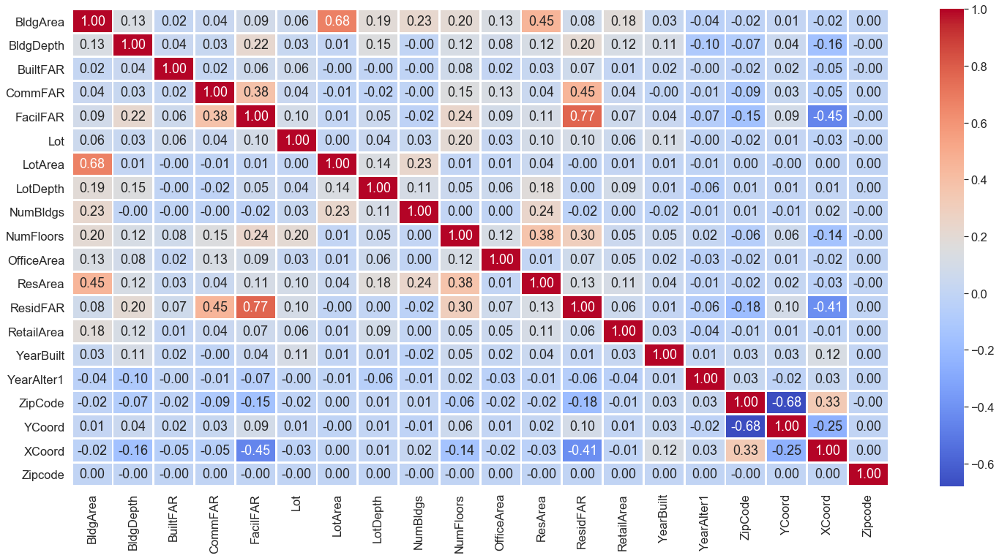

In [74]:
plt.figure(figsize=(25,12))
sns.heatmap(df5.corr(),cmap="coolwarm",annot=True,fmt='.2f',linewidths=2)
plt.show()

### Treat Duplicate Values

In [75]:
df5.duplicated(keep='first').sum()

0

### Feature Engineering

In [76]:
df5['Age'] = df5['YearAlter1'] - df5['YearBuilt']

In [77]:
df5.head()

,Address,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,Lot,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,YearBuilt,YearAlter1,ZipCode,YCoord,XCoord,ComplaintType,Zipcode,Street,Borough,Age
0,2 STREET,1760.0,39.0,0.61,2.0,10.0,1,1684828.0,268.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,201510.0,1035070.0,HEAT/HOT WATER,11413.0,129 AVENUE,QUEENS,71.0
1,2 STREET,1760.0,39.0,0.61,2.0,10.0,3,21139.0,110.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,209421.0,995513.0,UNSANITARY CONDITION,11102.0,23 STREET,QUEENS,71.0
2,1-50 51 AVENUE,136108.0,249.0,4.07,2.0,10.0,8,33454.0,184.48,1.0,5.0,1680.0,1600.0,10.0,1500.0,2011.0,2011.0,11101.0,209867.0,995477.0,PLUMBING,11411.0,219 STREET,QUEENS,0.0
3,2 STREET,1760.0,39.0,0.61,2.0,10.0,20,28703.0,100.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,201510.0,1035070.0,APPLIANCE,11423.0,199 STREET,QUEENS,71.0
4,CENTER BOULEVARD,1760.0,39.0,0.61,2.0,10.0,30,32493.0,202.08,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,201510.0,1035070.0,WATER LEAK,11413.0,MONTAUK STREET,QUEENS,71.0


In [78]:
df5['Period'] = 2020 - df5['YearBuilt']

In [79]:
df5.head()

,Address,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,Lot,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,YearBuilt,YearAlter1,ZipCode,YCoord,XCoord,ComplaintType,Zipcode,Street,Borough,Age,Period
0,2 STREET,1760.0,39.0,0.61,2.0,10.0,1,1684828.0,268.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,201510.0,1035070.0,HEAT/HOT WATER,11413.0,129 AVENUE,QUEENS,71.0,85.0
1,2 STREET,1760.0,39.0,0.61,2.0,10.0,3,21139.0,110.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,209421.0,995513.0,UNSANITARY CONDITION,11102.0,23 STREET,QUEENS,71.0,85.0
2,1-50 51 AVENUE,136108.0,249.0,4.07,2.0,10.0,8,33454.0,184.48,1.0,5.0,1680.0,1600.0,10.0,1500.0,2011.0,2011.0,11101.0,209867.0,995477.0,PLUMBING,11411.0,219 STREET,QUEENS,0.0,9.0
3,2 STREET,1760.0,39.0,0.61,2.0,10.0,20,28703.0,100.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,201510.0,1035070.0,APPLIANCE,11423.0,199 STREET,QUEENS,71.0,85.0
4,CENTER BOULEVARD,1760.0,39.0,0.61,2.0,10.0,30,32493.0,202.08,1.0,2.0,1680.0,1600.0,10.0,1500.0,1935.0,2006.0,11101.0,201510.0,1035070.0,WATER LEAK,11413.0,MONTAUK STREET,QUEENS,71.0,85.0


### Drop unwanted features

In [80]:
df5.columns

Index(['Address', 'BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR',
       'Lot', 'LotArea', 'LotDepth', 'NumBldgs', 'NumFloors', 'OfficeArea',
       'ResArea', 'ResidFAR', 'RetailArea', 'YearBuilt', 'YearAlter1',
       'ZipCode', 'YCoord', 'XCoord', 'ComplaintType', 'Zipcode', 'Street',
       'Borough', 'Age', 'Period'],
      dtype='object')

In [81]:
df5.drop(['Zipcode', 'Street', 'Borough', 'Address','Lot','YearBuilt', 'YearAlter1', 
          'ZipCode','YCoord', 'XCoord'],axis=1,inplace=True)

In [82]:
df5.head()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,ComplaintType,Age,Period
0,1760.0,39.0,0.61,2.0,10.0,1684828.0,268.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,HEAT/HOT WATER,71.0,85.0
1,1760.0,39.0,0.61,2.0,10.0,21139.0,110.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,UNSANITARY CONDITION,71.0,85.0
2,136108.0,249.0,4.07,2.0,10.0,33454.0,184.48,1.0,5.0,1680.0,1600.0,10.0,1500.0,PLUMBING,0.0,9.0
3,1760.0,39.0,0.61,2.0,10.0,28703.0,100.00,1.0,2.0,1680.0,1600.0,10.0,1500.0,APPLIANCE,71.0,85.0
4,1760.0,39.0,0.61,2.0,10.0,32493.0,202.08,1.0,2.0,1680.0,1600.0,10.0,1500.0,WATER LEAK,71.0,85.0


### Treat Outliers

In [83]:
df5.columns

Index(['BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR', 'LotArea',
       'LotDepth', 'NumBldgs', 'NumFloors', 'OfficeArea', 'ResArea',
       'ResidFAR', 'RetailArea', 'ComplaintType', 'Age', 'Period'],
      dtype='object')

In [84]:
df5.describe(include='all')

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,ComplaintType,Age,Period
count,3.245830e+05,324583.000000,324583.000000,324583.000000,324583.000000,3.245830e+05,324583.000000,324583.000000,324583.000000,3.245830e+05,3.245830e+05,324583.000000,3.245830e+05,324583,324583.000000,324583.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,HEAT/HOT WATER,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,122516,NaN,NaN
mean,3.827122e+03,43.496421,0.765998,2.006949,1.637683,7.371967e+03,103.773587,1.474680,2.129478,1.783996e+03,2.752944e+03,0.924831,1.612536e+03,NaN,64.655490,78.822378
std,4.625384e+04,32.130147,4.931515,0.325230,0.871277,4.031172e+05,62.465677,4.178309,0.927333,4.764612e+03,1.922695e+04,0.656248,4.025246e+03,NaN,23.357351,23.247651
min,1.000000e+00,0.830000,0.010000,0.500000,1.000000,1.000000e+00,0.160000,1.000000,0.500000,2.500000e+01,1.200000e+02,0.500000,2.800000e+01,NaN,-78.000000,2.000000
25%,1.333000e+03,34.000000,0.440000,2.000000,1.000000,2.140000e+03,100.000000,1.000000,2.000000,1.680000e+03,1.288000e+03,0.600000,1.500000e+03,NaN,56.000000,70.000000
50%,1.760000e+03,39.000000,0.610000,2.000000,2.000000,2.850000e+03,100.000000,1.000000,2.000000,1.680000e+03,1.600000e+03,0.600000,1.500000e+03,NaN,71.000000,85.000000
75%,2.392000e+03,49.000000,0.870000,2.000000,2.000000,4.000000e+03,100.000000,2.000000,2.500000,1.680000e+03,2.112000e+03,0.900000,1.500000e+03,NaN,81.000000,95.000000


In [85]:
windsorizer = Winsorizer(distribution='skewed',tail='right',fold=3.0,
                         variables=None)

In [86]:
windsorizer.fit(df5)

Winsorizer(distribution='skewed', fold=3.0, tail='right',
           variables=['BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR',
                      'FacilFAR', 'LotArea', 'LotDepth', 'NumBldgs',
                      'NumFloors', 'OfficeArea', 'ResArea', 'ResidFAR',
                      'RetailArea', 'Age', 'Period'])

In [87]:
df6 = windsorizer.transform(df5)

In [88]:
df6.head()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,ComplaintType,Age,Period
0,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,HEAT/HOT WATER,71.0,85.0
1,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,UNSANITARY CONDITION,71.0,85.0
2,5569.0,94.0,2.16,2.0,5.0,9580.0,100.0,1.0,4.0,1680.0,1600.0,1.8,1500.0,PLUMBING,0.0,9.0
3,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,APPLIANCE,71.0,85.0
4,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,WATER LEAK,71.0,85.0


In [89]:
df6.describe()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,Age,Period
count,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000,324583.000000
mean,2079.554866,42.446418,0.727066,1.982682,1.624372,3425.720124,95.898671,1.421867,2.096336,1671.308701,1819.495026,0.852556,1489.588740,64.652277,78.819165
std,1107.510393,14.272095,0.438650,0.133256,0.791308,1870.196273,11.230848,0.545196,0.566950,88.471208,796.878650,0.390687,79.103191,23.338149,23.228382
min,1.000000,0.830000,0.010000,0.500000,1.000000,1.000000,0.160000,1.000000,0.500000,25.000000,120.000000,0.500000,28.000000,-78.000000,2.000000
25%,1333.000000,34.000000,0.440000,2.000000,1.000000,2140.000000,100.000000,1.000000,2.000000,1680.000000,1288.000000,0.600000,1500.000000,56.000000,70.000000
50%,1760.000000,39.000000,0.610000,2.000000,2.000000,2850.000000,100.000000,1.000000,2.000000,1680.000000,1600.000000,0.600000,1500.000000,71.000000,85.000000
75%,2392.000000,49.000000,0.870000,2.000000,2.000000,4000.000000,100.000000,2.000000,2.500000,1680.000000,2112.000000,0.900000,1500.000000,81.000000,95.000000
max,5569.000000,94.000000,2.160000,2.000000,5.000000,9580.000000,100.000000,5.000000,4.000000,1680.000000,4584.000000,1.800000,1500.000000,156.000000,170.000000


In [90]:
windsorizer.left_tail_caps_

{}

In [91]:
windsorizer.right_tail_caps_

{'BldgArea': 5569.0,
 'BldgDepth': 94.0,
 'BuiltFAR': 2.16,
 'CommFAR': 2.0,
 'FacilFAR': 5.0,
 'LotArea': 9580.0,
 'LotDepth': 100.0,
 'NumBldgs': 5.0,
 'NumFloors': 4.0,
 'OfficeArea': 1680.0,
 'ResArea': 4584.0,
 'ResidFAR': 1.8000000000000003,
 'RetailArea': 1500.0,
 'Age': 156.0,
 'Period': 170.0}

### Predict top 5 311 Problems (HEAT/HOT WATER, PAINT/PLASTER, PLUMBING, UNSANITARY CONDITION ). Create a new category called Others

In [92]:
df6['ComplaintType'].value_counts()

HEAT/HOT WATER          122516
PLUMBING                 35472
PAINT/PLASTER            32638
UNSANITARY CONDITION     32572
GENERAL CONSTRUCTION     20442
ELECTRIC                 19183
NONCONST                 12456
DOOR/WINDOW              11382
WATER LEAK               10930
GENERAL                   9099
FLOORING/STAIRS           6502
APPLIANCE                 5936
SAFETY                    4351
OUTSIDE BUILDING           563
ELEVATOR                   538
STRUCTURAL                   2
VACANT APARTMENT             1
Name: ComplaintType, dtype: int64

In [93]:
df6.replace(to_replace='GENERAL CONSTRUCTION',value='OTHERS',inplace=True)

In [94]:
df6.replace(to_replace='ELECTRIC',value='OTHERS',inplace=True)

In [95]:
df6.replace(to_replace='DOOR/WINDOW',value='OTHERS',inplace=True)

In [96]:
df6.replace(to_replace='WATER LEAK',value='OTHERS',inplace=True)

In [97]:
df6.replace(to_replace='NONCONST',value='OTHERS',inplace=True)

In [98]:
df6.replace(to_replace='FLOORING/STAIRS',value='OTHERS',inplace=True)

In [99]:
df6.replace(to_replace='GENERAL',value='OTHERS',inplace=True)

In [100]:
df6.replace(to_replace='APPLIANCE',value='OTHERS',inplace=True)

In [101]:
df6.replace(to_replace='SAFETY',value='OTHERS',inplace=True)

In [102]:
df6.replace(to_replace='ELEVATOR',value='OTHERS',inplace=True)

In [103]:
df6.replace(to_replace='OUTSIDE BUILDING',value='OTHERS',inplace=True)

In [104]:
df6.replace(to_replace='STRUCTURAL',value='OTHERS',inplace=True)

In [105]:
df6.replace(to_replace='VACANT APARTMENT',value='OTHERS',inplace=True)

In [106]:
df6['ComplaintType'].value_counts()

HEAT/HOT WATER          122516
OTHERS                  101385
PLUMBING                 35472
PAINT/PLASTER            32638
UNSANITARY CONDITION     32572
Name: ComplaintType, dtype: int64

In [107]:
df6.head()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,ComplaintType,Age,Period
0,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,HEAT/HOT WATER,71.0,85.0
1,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,UNSANITARY CONDITION,71.0,85.0
2,5569.0,94.0,2.16,2.0,5.0,9580.0,100.0,1.0,4.0,1680.0,1600.0,1.8,1500.0,PLUMBING,0.0,9.0
3,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,OTHERS,71.0,85.0
4,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,OTHERS,71.0,85.0


In [108]:
encoder = LabelEncoder()

In [109]:
df6['ComplaintType'] = encoder.fit_transform(df6['ComplaintType'])

In [110]:
df6['ComplaintType'].value_counts()

0    122516
1    101385
3     35472
2     32638
4     32572
Name: ComplaintType, dtype: int64

In [111]:
df6.head()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,ComplaintType,Age,Period
0,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,0,71.0,85.0
1,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,4,71.0,85.0
2,5569.0,94.0,2.16,2.0,5.0,9580.0,100.0,1.0,4.0,1680.0,1600.0,1.8,1500.0,3,0.0,9.0
3,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,1,71.0,85.0
4,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,1,71.0,85.0


### HEAT/HOT WATER = 0; OTHERS = 1; PAINT/PLASTER = 2; PLUMBING = 3; UNSANITARY CONDITION = 4

In [112]:
df6.columns

Index(['BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR', 'LotArea',
       'LotDepth', 'NumBldgs', 'NumFloors', 'OfficeArea', 'ResArea',
       'ResidFAR', 'RetailArea', 'ComplaintType', 'Age', 'Period'],
      dtype='object')

In [113]:
df6 = df6[['BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR',
       'FacilFAR', 'LotArea', 'LotDepth', 'NumBldgs', 'NumFloors',
       'OfficeArea', 'ResArea', 'ResidFAR', 'RetailArea', 'Age', 'Period','ComplaintType']]

In [114]:
df6.head()

,BldgArea,BldgDepth,BuiltFAR,CommFAR,FacilFAR,LotArea,LotDepth,NumBldgs,NumFloors,OfficeArea,ResArea,ResidFAR,RetailArea,Age,Period,ComplaintType
0,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,71.0,85.0,0
1,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,71.0,85.0,4
2,5569.0,94.0,2.16,2.0,5.0,9580.0,100.0,1.0,4.0,1680.0,1600.0,1.8,1500.0,0.0,9.0,3
3,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,71.0,85.0,1
4,1760.0,39.0,0.61,2.0,5.0,9580.0,100.0,1.0,2.0,1680.0,1600.0,1.8,1500.0,71.0,85.0,1


### Create and save processed dataset

In [115]:
#df6.to_csv("queensclasstrain.csv",index=False)